# Overview / Contents
This notebook uses the [UCI bike sharing dataset](https://archive.ics.uci.edu/ml/datasets/bike+sharing+dataset) to demonstrate the shap library. The main steps are:
 - Data load
 - Feature preprocessing (add descriptive labels, one-hot encode)
 - Train a random forest
 - Plot scikits's feature importance
 - Display some trees
 - Use SHAP to generate explanations
 - Demonstrate SHAP's plotting capabilities
 
The model hasn't been evaluated (beyond a simple oob_score) or validated as the main purpose is to demonstrate SHAP. However it might be interesting to explore different ways of encoding the columns (e.g. ordinals instead of one-hot).

# Imports

In [1]:
from multiprocessing import Pool
from os import nice
from subprocess import run

from IPython.display import Image
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import OneHotEncoder
from sklearn.tree import export_graphviz

%matplotlib inline

np.random.seed(808)

# Load data

In [2]:
bike_data = pd.read_csv('bike_sharing.csv', index_col=0)
bike_data.shape

(17379, 16)

## Preprocessing

### Define features and response

In [3]:
features = [
    'season',
    'yr',
    'mnth',
    'hr',
    'holiday',
    'weekday',
    'workingday',
    'weathersit',
    'temp',
    'atemp',
    'hum',
    'windspeed'
]

In [4]:
response = 'cnt'

### Map codes to descriptive labels 

In [5]:
maps = {}

maps['season'] = {
    1: 'spring',
    2: 'summer',
    3: 'autumn',
    4: 'winter',
}

maps['yr'] = {
    0: 2011,
    1: 2012,
}

maps['weekday'] = {
    0: 'sun',
    1: 'mon',
    2: 'tue',
    3: 'wed',
    4: 'thu',
    5: 'fri',
    6: 'sat',
}

maps['weathersit'] = {
    1: 'Good',
    2: 'Fair',
    3: 'Poor',
    4: 'Bad',
}

In [6]:
for col in maps.keys():
    bike_data[col] = bike_data[col].map(maps[col])

### Identify one-hot features

In [7]:
to_onehot_encode = [
    'season',
    'mnth',
    'hr',
    'weekday',
    'weathersit',
]

In [8]:
non_onehot_cols = sorted(set(features) - set(to_onehot_encode))
non_onehot_cols

['atemp', 'holiday', 'hum', 'temp', 'windspeed', 'workingday', 'yr']

# Transform features and train model

## One-hot encode categoricals

In [9]:
encoder = OneHotEncoder(categories='auto', sparse=False).fit(bike_data[to_onehot_encode])
encoded_column_names = list(encoder.get_feature_names(input_features=to_onehot_encode))
encoded_data = encoder.transform(bike_data[to_onehot_encode])

encoded_data.shape, bike_data[non_onehot_cols].shape

((17379, 51), (17379, 7))

In [10]:
X = np.concatenate([encoded_data, bike_data[non_onehot_cols]], axis=1)
X.shape

(17379, 58)

In [11]:
type(X)

numpy.ndarray

In [12]:
feature_names = encoded_column_names + non_onehot_cols
# feature_names

## Train model

In [13]:
random_state = np.random.RandomState(seed=808)

In [14]:
rfr = RandomForestRegressor(
    n_estimators=200,
    criterion='mse',
    max_depth=10,
    min_samples_split=5,
    min_samples_leaf=2,
    max_features=0.5,
    max_leaf_nodes=None,
    bootstrap=True,
    oob_score=True,
    random_state=random_state,
    verbose=0,
)

In [15]:
y = np.array(bike_data[response])

In [16]:
%%time
rfr.fit(X, y);

CPU times: user 4.39 s, sys: 29.5 ms, total: 4.42 s
Wall time: 4.47 s


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=10,
                      max_features=0.5, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=2, min_samples_split=5,
                      min_weight_fraction_leaf=0.0, n_estimators=200,
                      n_jobs=None, oob_score=True,
                      random_state=RandomState(MT19937) at 0x125BD78D0,
                      verbose=0, warm_start=False)

In [17]:
# This is the R^2 of the model evaluated on the out-of-bag samples: i.e. predictions for each data point
# are made using the set of trees for which that data point wasn't in the bootstrapped training sample

rfr.oob_score_ # 0.7757824594719793

0.7757824594719793

# Standard model diagnostics

## Plot distribution of model predictions

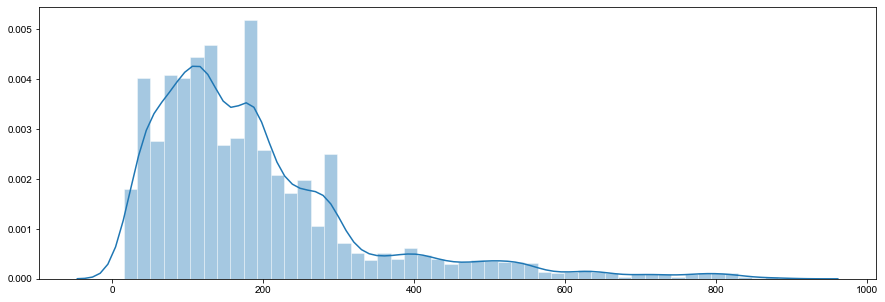

In [18]:
fig, ax = plt.subplots(figsize=(15,5))
sns.set_style("darkgrid")
sns.distplot(rfr.predict(X));

## Plot feature importance

In [19]:
feature_importances = pd.Series(
    rfr.feature_importances_,
    index=feature_names,
)

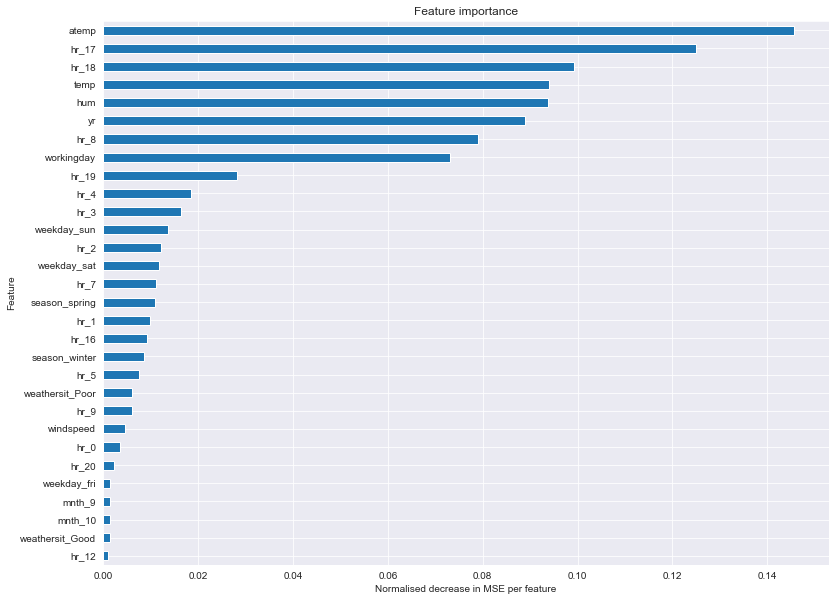

In [20]:
fig, ax = plt.subplots(figsize=(13, 10))
feature_importances.sort_values(ascending=True).tail(30).plot(kind='barh', ax=ax)
ax.set_xlabel('Normalised decrease in MSE per feature')
ax.set_ylabel('Feature')
ax.set_title('Feature importance');

## Show some trees

In [21]:
random_tree = rfr.estimators_[np.random.randint(rfr.n_estimators)]

In [22]:
export_graphviz(random_tree, 
                out_file='tree.dot', 
                feature_names=feature_names,
                rounded=True,
                proportion=False, 
                filled=True)

In [23]:
run(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=100']);

In [24]:
Image(filename='tree.png', unconfined=False)

In [25]:
export_graphviz(random_tree, 
                out_file='tree_trunc3.dot', 
                feature_names=feature_names,
                rounded=True,
                proportion=False, 
                filled=True,
                max_depth=3)

In [26]:
run(['dot', '-Tpng', 'tree_trunc3.dot', '-o', 'tree_trunc3.png', '-Gdpi=100']);

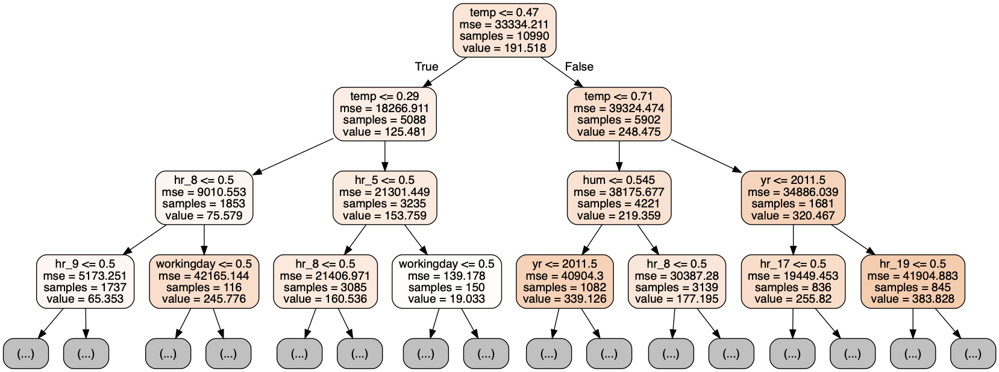

In [27]:
Image(filename='tree_trunc3.png', unconfined=False)

# SHAP model diagnostics

In [28]:
shap.initjs()

In [29]:
explainer = shap.TreeExplainer(rfr)

In [30]:
explainer.expected_value

189.6124428908453

In [31]:
def explain(x):
    nice(19) # really nice!
    return explainer.shap_values(x) # we want explanations for p(got_loan)

In [32]:
load_explanations_from_cache = True

In [33]:
%%time
if load_explanations_from_cache:
    explanations = np.load('bike_explanations.npy')

else:
    with Pool() as p:
        explanations = p.map(explain, X)
    explanations = np.stack(explanations)
    np.save('bike_explanations.npy', explanations)

explanations.shape

CPU times: user 1.28 ms, sys: 8.75 ms, total: 10 ms
Wall time: 9.86 ms


(17379, 58)

In [34]:
def plot_single_prediction(idx):
    return shap.force_plot(
        base_value=explainer.expected_value,
        shap_values=explanations[idx],
        feature_names=[f'{feature_names[i]}={X[idx,i]:.2f}' for i in range(len(feature_names))]
    )

## Check model predictions for extreme observed datapoints

In [35]:
display(plot_single_prediction(bike_data['cnt'].idxmax()))

In [36]:
display(plot_single_prediction(bike_data['cnt'].idxmin()))

## Summary plots

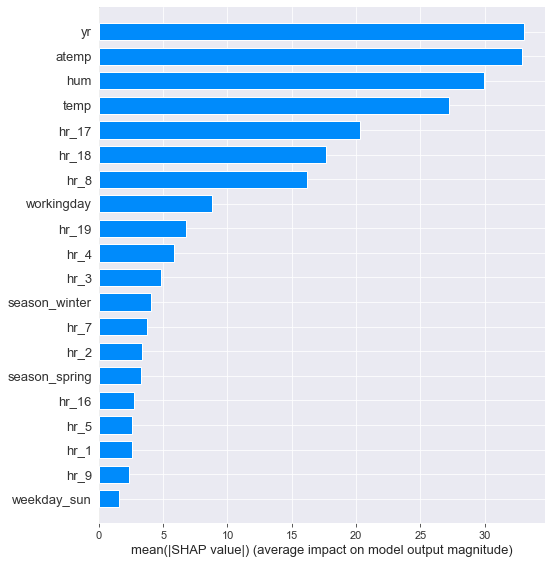

In [37]:
shap.summary_plot(
    shap_values=explanations,
    features=X,
    feature_names=feature_names,
    plot_type='bar',
)

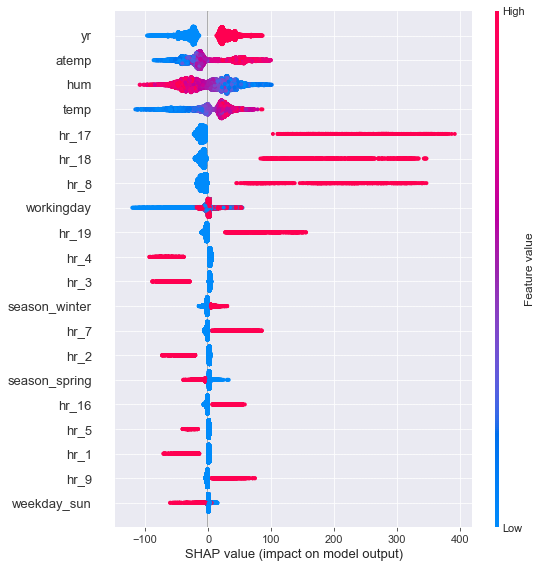

In [38]:
shap.summary_plot(
    shap_values=explanations,
    features=X,
    feature_names=feature_names,
    max_display=20
)

## Explore interactions

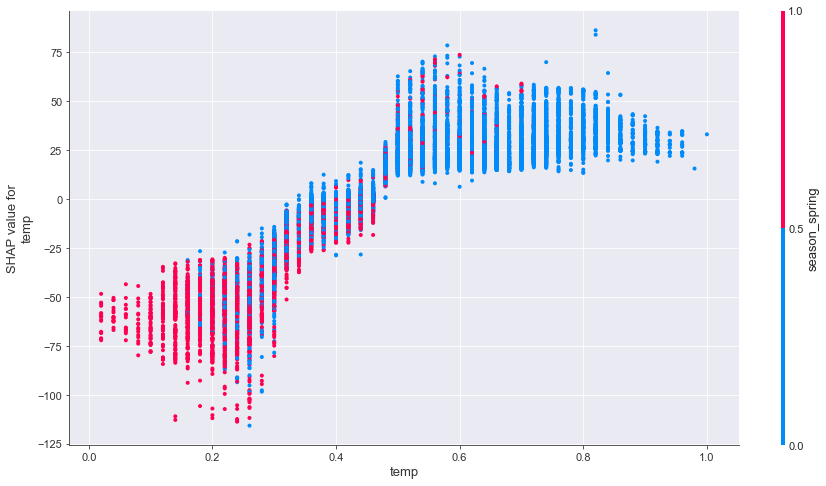

In [39]:
fig, ax = plt.subplots(figsize=(15,8))
shap.dependence_plot(
    ind=feature_names.index('temp'),
    shap_values=explanations,
    features=X,
    feature_names=feature_names,
    interaction_index=feature_names.index('season_spring'),
    ax=ax,
)

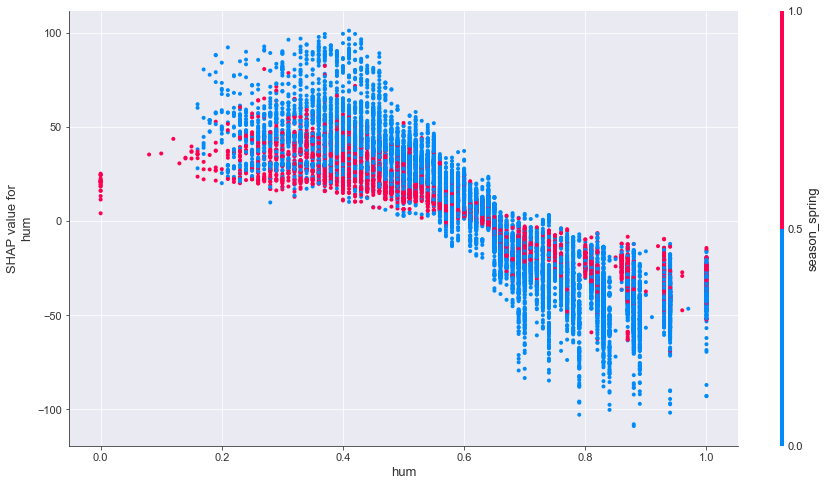

In [40]:
fig, ax = plt.subplots(figsize=(15,8))
shap.dependence_plot(
    ind=feature_names.index('hum'),
    shap_values=explanations,
    features=X,
    feature_names=feature_names,
    interaction_index=feature_names.index('season_spring'),
    ax=ax,
)